In [1]:
import numpy as np
import matplotlib.pyplot as plt
import flika as flk
flk.start_flika()
from matplotlib.gridspec import GridSpec
from flika.window import Window as flw
import matplotlib 
from scipy.ndimage.filters import median_filter
from dask.array import coarsen
from fish.image.zds import to_dask, ZDS
from fish.util.distributed import get_jobqueue_cluster
from dask.distributed import Client
from fish.util.plot import depth_project
matplotlib.rc('font', family='arial')
from skimage.exposure import rescale_intensity as rescale
from fish.util.plot import apply_cmap
fig_dir = '../../figures/ch2/'
%matplotlib inline

Starting flika
Starting flika inside IPython


In [2]:
base_dir = '/nrs/ahrens/davis/data/spim/raw/20160607/5dpf_cy171xcy221_f1_omr_1_20160607_183009/'
reg_path = base_dir.replace('raw', 'proc') + 'reg/regparams_affine.npy'
dset = ZDS(base_dir)
data=dset.data
fs_im = dset.metadata['volume_rate']
try: 
    shifts = -np.load(reg_path)[:,:-1,-1]
except FileNotFoundError:
    shifts = None    
    print('No valid regparams found. They will be estimated')
data.shape

(5000, 37, 2048, 2048)

In [25]:
def scale_bar(x0, y0, width, length, um_per_pixel):
    from matplotlib.patches import Rectangle    
    from matplotlib.text import Text
    from numpy import array
    
    pix_units = array(um_per_pixel)
    width_um = array([width, length])
    origin_um = array([x0,y0])
    
    scb_dims = width_um / pix_units
    origin = origin_um / pix_units
    
    rect = Rectangle(origin, *scb_dims, fill=True, edgecolor=None, facecolor='w')
    text = Text(rect.xy[0], rect.xy[1] - (3 * scb_dims[1]) / 2, f'{width} μm', color='w')
    
    return rect, text

def axs_format(ax):
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
def mydff(v):
    from fish.image.vol import dff
    camera_offset = 80
    window = 300 * fs_im
    percentile = 20
    offset = 10    
    downsample = 10;
    return dff((v - camera_offset).clip(1, None), window, percentile, offset, downsample, axis=0).astype('float32')

def shift_yx(im, shifts, block_id):
    from scipy.ndimage.interpolation import shift
    t = block_id[0]    
    return shift(im.astype('float32'), (0,0, *shifts[t]), order=1, cval=100)

def reg(fixed, moving):
    from fish.image.alignment import estimate_translation    
    from numpy import expand_dims
    affs =  estimate_translation(fixed.squeeze(), moving.squeeze()).affine
    return expand_dims(affs, 0)

def prune(data, thresholds):
    from numpy import bincount
    out = data.copy()
    sizes = bincount(out.ravel())
    
    lower = sizes < thresholds[0]
    lower_mask = lower[data]
    
    upper = sizes > thresholds[1]
    upper_mask = upper[data]
    
    out[lower_mask] = 0
    out[upper_mask] = 0
    
    return out

def mdp(data, axis, cmap):
    from skimage.exposure import rescale_intensity as rescale
    from matplotlib.cm import get_cmap
    from numpy import argmax, linspace, zeros
    # max project to get intensity, then use depth to set color
    mx = rescale(data.max(axis).astype('float'), out_range=(0,1))
    remapped = zeros((*mx.shape[1:], 4))
    dp = argmax(data, axis)    
    col_array = get_cmap(cmap)(linspace(0, 1, data.shape[axis]))
    remapped = (col_array[dp,:].transpose(2,1,0) * mx.T).transpose(2,1,0)
    
    return remapped
    
def slices_to_rect(slices, full_shape, **kwargs):
    from matplotlib.patches import Rectangle
    from numpy import arange
    inds = arange(full_shape[0])[slices[0]], arange(full_shape[1])[slices[1]]
    origin = inds[1][0], inds[0][0]
    width = inds[1][-1] - inds[1][0]
    height = inds[0][-1] - inds[0][0]
    return Rectangle(origin, width, height, **kwargs)
    

In [5]:
cluster = get_jobqueue_cluster()
client = Client(cluster)
client

/groups/ahrens/home/bennettd/miniconda/lib/python3.6/site-packages/distributed/bokeh/core.py:57: UserWarning: 
Port 8787 is already in use. 
Perhaps you already have a cluster running?
Hosting the diagnostics dashboard on a random port instead.
  warnings.warn('\n' + msg)


Client Scheduler: tcp://10.36.111.11:38878 Dashboard: http://10.36.111.11:36562/status,Cluster Workers: 0 Cores: 0 Memory: 0 B


In [6]:
import flika as flk
flk.start_flika()

Starting flika
flika menubar already initialized.
Starting flika inside IPython


In [7]:
sample_anat = data[0].compute(scheduler='threads')

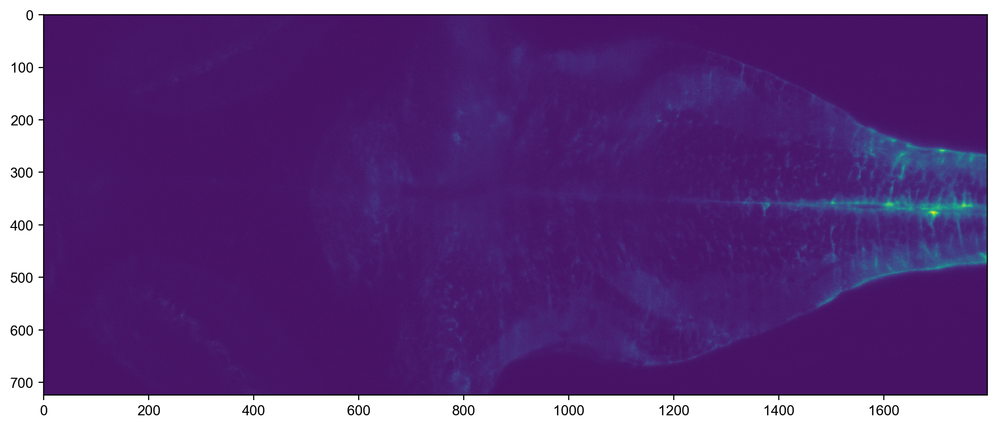

In [8]:
roi = (slice(None), slice(24,25), slice(1224, -100), slice(250,None))
fig, axs = plt.subplots(figsize=(12,12), dpi=200)
axs.imshow(sample_anat[roi[1:]].max(0))

In [9]:
data_tx = data[roi].map_blocks(shift_yx, shifts[roi[0]], dtype='float32')
data_filt = data_tx.map_blocks(lambda v: median_filter(v, size=(1,1,3,3)))
ds_xy = 1
data_ds = coarsen(np.mean, data_filt, {2: ds_xy, 3: ds_xy})
rechunked = data_ds.rechunk(chunks=(-1, 'auto','auto','auto'))
data_dff = rechunked.map_blocks(mydff, dtype='float32')

In [10]:
data_dff.shape

(5000, 1, 724, 1798)

In [11]:
cluster.start_workers(100)
sample = data_dff.compute()
cluster.stop_all_jobs()

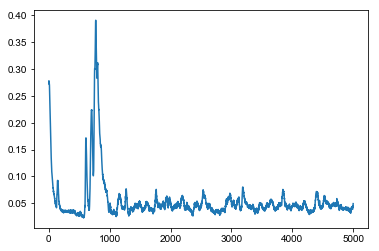

In [12]:
plt.plot(sample.mean((1,2,3)))

In [13]:
plr_t =  slice(1200,2400)
z = 0
roi_plt = plr_t, slice(z,z+1), slice(None), slice(800,1500)
pln = sample[roi_plt].squeeze()

In [28]:
proj_cmap = 'rainbow'
dff_dpth = mdp(pln.clip(.15, 1), 0, proj_cmap)
anat_gray = apply_cmap(sample_anat[roi[1:]][:,::ds_xy,::ds_xy][roi_plt[1:]].squeeze(),'gray')
anat_gray_fl = rescale(anat_gray.astype('float'), out_range=(0,1)) * np.array([.5,.5,.5,1])
composite = (dff_dpth + anat_gray_fl)
subr = slice(400,700),slice(400,-100)

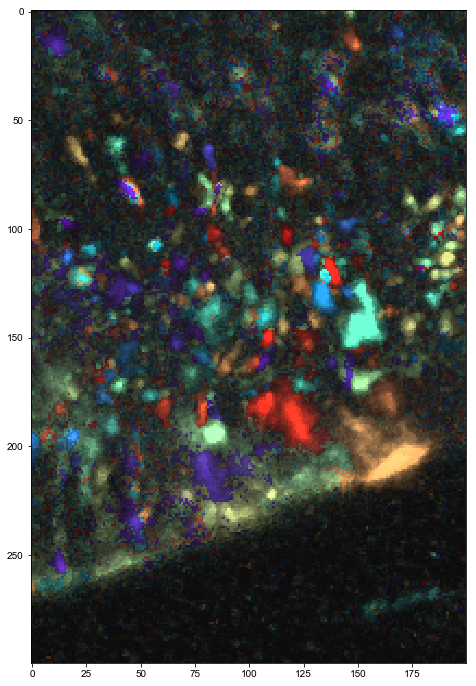

In [31]:
fig, axs = plt.subplots(figsize=(12,12))
plt.imshow(composite[subr])

In [17]:
out_ptfile_fname = '../../data/ch2/sparse_roi_pts.pickle'

In [60]:
win = flw(composite[subr].transpose(1,0,2))

In [96]:
pts = [r.getPoints().astype('int') for r in win.rois]
# save points
from pickle import dump
with open(out_ptfile_fname,'wb') as f:
    dump(pts, f)

In [18]:
# load points
from pickle import load
with open(out_ptfile_fname, 'rb') as f:
    pts = load(f)

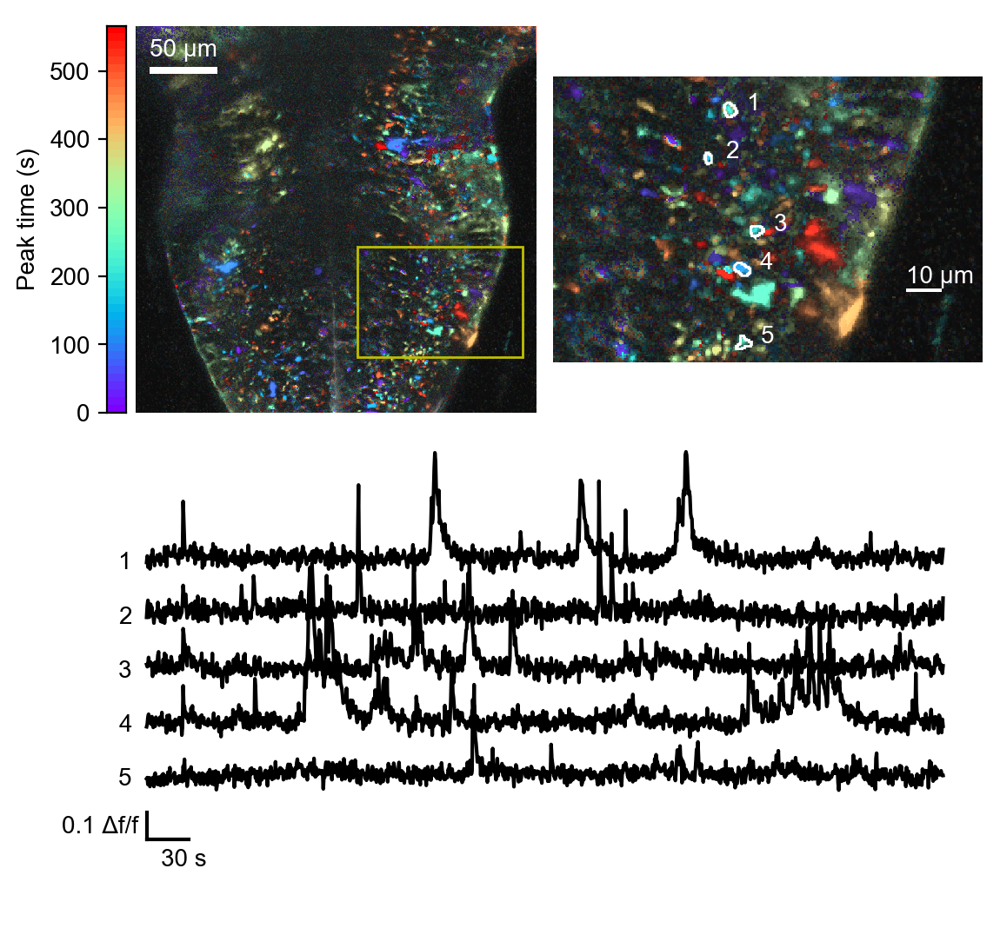

In [40]:
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Polygon
from mpl_toolkits.axes_grid1 import make_axes_locatable

fig = plt.figure(figsize=(6.5, 6.5), dpi=200)
gs = GridSpec(nrows=2,ncols=2, height_ratios=(1,1))

axs = []
axs.append(fig.add_subplot(gs[0,0]))
axs.append(fig.add_subplot(gs[0,1]))
axs.append(fig.add_subplot(gs[1,:]))
rect = slices_to_rect(subr[::-1], composite.shape[:2][::-1], fill=False, edgecolor='y')
ts_data = pln[(slice(None), *subr)].transpose(0,2,1)

[axs[0].add_artist(scb) for scb in scale_bar(10,30,50,5,(.40625,.40625))]
[axs[1].add_artist(scb) for scb in scale_bar(100,60,10,1,(.40625,.40625))]

polys = [Polygon(p[:,::-1], alpha=1, facecolor='w', edgecolor='w', fill=False) for p in pts]
[axs[1].add_patch(p) for p in polys]
[axs[1].text(p.mean(0)[1] + 12, p.mean(0)[0], ind + 1, color='w') for ind,p in enumerate(pts)]

axs[0].add_patch(rect)
axs[0].set_facecolor('k')
axs[0].imshow(composite.transpose(1,0,2))
divider = make_axes_locatable(axs[0])

cax = divider.append_axes("left", size="5%", pad=0.05)
cax.imshow(np.linspace(1,0).reshape(-1,1), cmap=proj_cmap, extent=(0,pln.shape[0]/fs_im/20,0,pln.shape[0]/fs_im))
#cax.yaxis.tick_right()
#cax.yaxis.set_label_position('right')
cax.xaxis.set_visible(False)
cax.set_ylabel('Peak time (s)')

axs[1].imshow(composite[subr].transpose(1,0,2))
offset_scale = 1/5
[axs[2].plot(np.arange(ts_data.shape[0]) / fs_im, ts_data[:,p[:,0], p[:,1]].mean(1) - ind * offset_scale, label=ind, color='k') for ind,p in enumerate(pts)]; 
[axs[2].text(-20,-offset_scale * ind, ind+1) for ind in range(len(pts))];
axs[2].set_xlabel('Time (s)')
scb_x_len = 30
scb_y_len = .1
scb_x = np.array([0, scb_x_len])
scb_y = np.array([0, scb_y_len]) - 1
axs[2].plot(2*[scb_x[0]],scb_y, color='k', zorder=0)
axs[2].plot(scb_x, 2*[scb_y[0]], color='k', zorder=0)
axs[2].text(scb_x[0]-60, scb_y[0] + (scb_y_len)/4, f'{(scb_y_len):.0} Δf/f')
axs[2].text(scb_x[0] + scb_x_len/3, scb_y[0] - .1, f'{(scb_x_len):} s')
[ax.axis('off') for ax in axs];

fig_fname = f'{dset.exp_name}_sparse_glial_activity.pdf'
plt.subplots_adjust(hspace=0)
[plt.subplots_adjust(wspace=.04)]
plt.savefig(fig_dir + fig_fname)

In [240]:
flw(pln)

/groups/ahrens/home/bennettd/miniconda/lib/python3.6/site-packages/pyqtgraph/imageview/ImageView.py:588: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  data = data[sl]


In [242]:
flk.start_flika()

Starting flika
flika menubar already initialized.
Starting flika inside IPython


In [ ]:
exp_name = dset.metadata['data_header']
out_path = '/groups/ahrens/ahrenslab/davis/tmp/{exp_name}_mxt.tif'

In [21]:
from skimage.io import imsave
imsave(out_path, result)

In [19]:
result.shape

(37, 1024, 1024)

In [15]:
flk.start_flika()

Starting flika
flika menubar already initialized.
Starting flika inside IPython


In [16]:
flw(np.log(result))

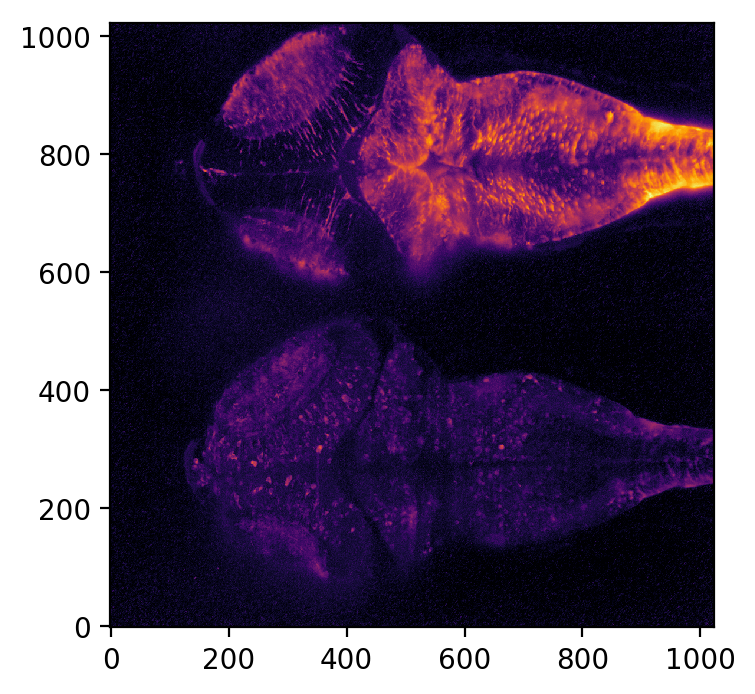

In [28]:
fig, axs = plt.subplots(dpi=200)
plt.imshow(np.log(result)[28], cmap='inferno', origin='lower', aspect=1, clim=(-2,None))

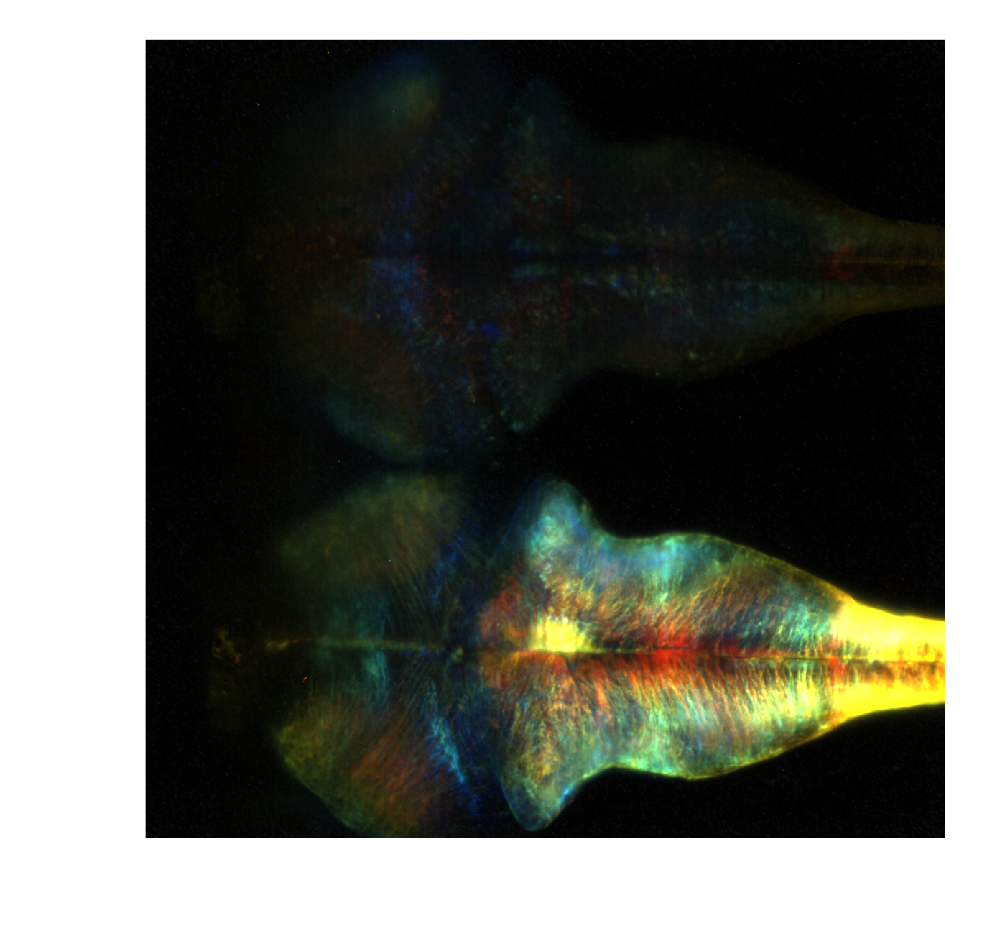

In [24]:
fig, axs = plt.subplots(dpi=500)
axs.axis('off')
plt.imshow(depth_project(result, clim=(.15,25)))

In [17]:
flk.start_flika()

Starting flika
flika menubar already initialized.
Starting flika inside IPython


In [28]:
result.shape[0] // 5

1000

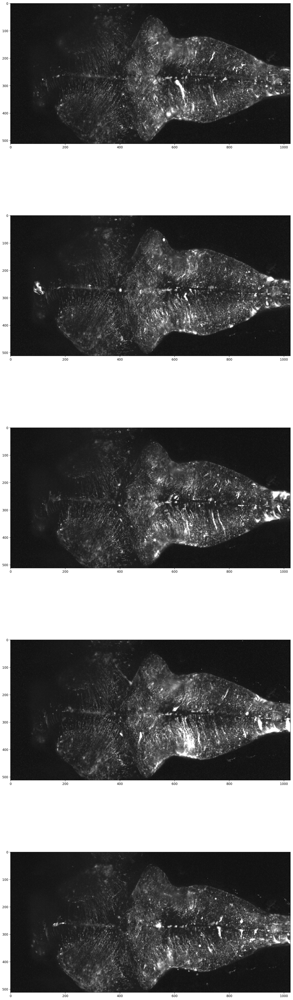

In [14]:
result_ = result[1000:4000]
fig, axs = plt.subplots(dpi=200, nrows=5, figsize=(16,60))
step = result_.shape[0] // 5
for ind,ax in enumerate(axs):
    ax.imshow(result_[step * ind : step * (ind + 1)].max(0), cmap='gray', clim=(0,2))

In [16]:
win = flw(result.transpose(0,2,1))

/groups/ahrens/home/bennettd/anaconda3/lib/python3.6/site-packages/pyqtgraph/imageview/ImageView.py:588: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  data = data[sl]


In [ ]:
from PyQt5.QtGui import QTransform

In [ ]:
win.imageview.imageItem.setTransform(QTransform().scale(1,3))